## Mini Project III
https://github.com/lighthouse-labs/mini-project-III

In [83]:
import os
import numpy as np
import pandas as pd

#run at the end gc.collect
import gc 

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
from matplotlib.pyplot import *
%matplotlib inline

from sklearn.preprocessing import StandardScaler
import scipy.cluster.hierarchy as sch
# aglomerative clustering
from sklearn.cluster import AgglomerativeClustering

In [84]:
import sqlite3
from sqlite3 import Error

def create_connection(path):
    connection = None
    try:
        connection = sqlite3.connect(path)
        print("Connection to SQLite DB successful")
    except Error as e:
        print(f"The error '{e}' occurred")

    return connection

In [85]:
connection = create_connection("./data.sqlite")

Connection to SQLite DB successful


### Data
We will be using old data about different financial transactions. You can download the data from [here](https://drive.google.com/file/d/1zAjnf936aHkwVCq_BmA47p4lpRjyRzMf/view?usp=sharing). The data contains following tables:

- twm_customer - information about customers
- twm_accounts - information about accounts
- twm_checking_accounts - information about checking accounts (subset of twm_accounts)
- twm_credit_accounts - information about checking accounts (subset of twm_accounts)
- twm_savings_accounts - information about checking accounts (subset of twm_accounts)
- twm_transactions - information about financial transactions
- twm_savings_tran - information about savings transactions (subset of twm_transactions)
- twm_checking_tran - information about savings transactions (subset of twm_transactions)
- twm_credit_tran - information about credit checking (subset of twm_transactions)


### Output

In this miniproject, we will:

1.  create two separate customer segmentations (using clustering) to split them into 3-5 clusters: 
    - based on demographics (only on the information from twm_customer)
    - based on their banking behavior. We can take following things into consideration as banking behavior:
        - do they have savings account? How much do they save?
        - do they have credit account? How much do they live in debt?
        - are they making lot of small transactions or few huge ones?
2. visualize the created clusters using [radar charts](https://plotly.com/python/radar-chart/) and compare them agains each other
3. visualize segmentations using scatter plot. We will have to use PCA to be able to plot our observations in 2D.
4. (stretch) visualize in 2D how our clusters are evolving in each iteration of KMeans (for at least 20 iterations).
    - we will need to create own implementation of kmeans so we can see what is happening with the clusters during the iterations.


In [86]:
# add tables as variables
files = [file for file in os.listdir('data') if file.startswith('twm')]
for file in files:
    var_name = file.split('.')[0][4:]
    cmd = f"{var_name} = pd.read_csv('data/{file}', sep=';')"
    print(var_name)
    exec(cmd)

accounts
checking_acct
savings_tran
credit_acct
savings_acct
credit_tran
checking_tran
customer
transactions


In [87]:
# export to sql DB
accounts.to_sql('accounts', connection, if_exists='replace')
checking_acct.to_sql('checking_acct', connection, if_exists='replace')
savings_tran.to_sql('savings_tran', connection, if_exists='replace')
credit_acct.to_sql('credit_acct', connection, if_exists='replace')
savings_acct.to_sql('savings_acct', connection, if_exists='replace')
credit_tran.to_sql('credit_tran', connection, if_exists='replace')
checking_tran.to_sql('checking_tran', connection, if_exists='replace')
customer.to_sql('customer', connection, if_exists='replace')
transactions.to_sql('transactions', connection, if_exists='replace')

In [88]:
# all cust_id values are unique
checking_acct.cust_id.nunique() == checking_acct.cust_id.count()

True

In [89]:
# same num rows between all dfs
len(credit_tran.columns) == len(savings_tran.columns) == len(checking_tran.columns)

True

## Functions for Feature Extraction

In [90]:
# used in construct_dataframes
def convert_date(df, col):
    from datetime import datetime
    df[col] = pd.to_datetime(df[col], format='%d.%m.%Y')
    df['month'] = df[col].apply(lambda x: x.month)
    df['day'] = df[col].apply(lambda x: x.day)
    return print(f'converted column "{col}"; added mo & day cols')

In [91]:
# not used
def date_to_year(df, col):
    from datetime import datetime
    df[col] = pd.to_datetime(df[col], format='%d.%m.%Y')
    df[df[col].name+'_year'] = df[col].apply(lambda x: x.year)
    df.drop(columns=col,inplace=True)
    return print(f'exchanged datetime column "{col}"; for year')

In [92]:
# used in construct_dataframes
def month_select(df, month):
    c_id = month.index.values
    c_mo = month.values
    d = dict.fromkeys(df.columns)
    
    for i in range(len(c_id)):
        rows = df[(df['cust_id'] == c_id[i]) & (df['month'] == c_mo[i])]
        for col in rows:
            if d[col] == None:
                d[col] = rows[col].values.tolist()
            else:
                for i in rows[col].values.tolist():
                    d[col].append(i)
    
    month_df = pd.DataFrame(d)
    
    return month_df

In [93]:
# used immediately prior to construct_dataframes
def cleanup(df):
    try:
        df.drop(columns='per_check_fee', inplace=True)
    except Exception:
        pass
    finally:
        df.drop(columns=['acct_nbr','acct_start_date','acct_end_date'], inplace=True)
        df['account_active'] = df['account_active'].str.replace(r'.*Y.*', '1')
        df['account_active'] = df['account_active'].str.replace(r'.*N.*', '0')
        df['account_active'] = pd.to_numeric(df['account_active'])
    return None

In [94]:
def construct_dataframes(df,df_acct):
    
    df.sort_values(['cust_id', 'tran_id'], inplace=True)
    convert_date(df, 'tran_date')
    
    # feature extraction #
    # means
    avg_tran_amt = df.groupby(['cust_id']).mean().tran_amt.rename('avg_tran_amt')
    avg_credit = df[df.tran_amt > 0].groupby('cust_id').mean().tran_amt.rename('avg_credit')
    avg_debit = df[df.tran_amt < 0].groupby('cust_id').mean().tran_amt.rename('avg_debit')
    avg_t_per_mo = df.groupby(['cust_id', 'month']).count().reset_index().groupby('cust_id').mean().tran_id.rename('avg_t_per_mo')
    
    # total transactions
    total_t = df.groupby('cust_id').count().tran_id.rename('total_t')
    count_t_small = df[abs(df.tran_amt) < abs(df.tran_amt.mean())].groupby('cust_id').tran_id.count().rename('count_t_small')
    count_t_large = df[abs(df.tran_amt) > abs(df.tran_amt.mean())].groupby('cust_id').tran_id.count().rename('count_t_large')
    count_credit = df[df.tran_amt > 0].groupby('cust_id').count().tran_amt.rename('count_credit') #count_save
    count_debit = df[df.tran_amt < 0].groupby('cust_id').count().tran_amt.rename('count_debit')
    
    # days_zero
    days_zero = df[df.new_balance == 0].groupby('cust_id').count().tran_id.rename('days_zero')
    days_not_zero = df[df.new_balance != 0].groupby('cust_id').count().tran_id.rename('days_not_zero')
    
    # debt
    bal_most_debt = df.groupby('cust_id').new_balance.min().rename('bal_most_debt')
    mo_most_debt = df.groupby(['cust_id','month']).new_balance.min().reset_index().groupby('cust_id').min().month.rename('mo_most_debt')
    bal_least_debt = df.groupby('cust_id').new_balance.max().rename('bal_least_debt')
    mo_least_debt = df.groupby(['cust_id','month']).new_balance.max().reset_index().groupby('cust_id').max().month.rename('mo_least_debt')

    # high_transaction_rate
    high_t_mo = df.groupby(['cust_id','month']).count().reset_index().sort_values('tran_id',ascending=False).groupby('cust_id').nth(0).month.rename('high_t_mo')
    htm_count = df.groupby(['cust_id','month']).count().reset_index().groupby('cust_id').tran_id.max().rename('htm_count')
    high_mo = month_select(df, high_t_mo)
    htm_sbalance = high_mo.groupby('cust_id').nth(0).new_balance.rename('htm_sbalance')
    htm_ebalance = high_mo.sort_values('tran_id', ascending=False).groupby('cust_id').nth(0).new_balance.rename('htm_ebalance')
    
    # low_transaction_rate
    low_t_mo = df.groupby(['cust_id','month']).count().reset_index().sort_values('tran_id').groupby('cust_id').nth(0).month.rename('low_t_mo')
    ltm_count = df.groupby(['cust_id','month']).count().reset_index().groupby('cust_id').tran_id.min().rename('ltm_count')
    low_mo = month_select(df, low_t_mo)
    ltm_sbalance = low_mo.groupby('cust_id').nth(0).new_balance.rename('ltm_sbalance')
    ltm_ebalance = low_mo.sort_values('tran_id', ascending=False).groupby('cust_id').nth(0).new_balance.rename('ltm_ebalance')
    
    features = [avg_tran_amt, avg_credit, avg_debit, avg_t_per_mo,
               total_t, count_t_small, count_t_large, count_credit, count_debit,
               days_zero, days_not_zero,
               bal_most_debt, mo_most_debt, bal_least_debt, mo_least_debt,
               high_t_mo, htm_count, htm_sbalance, htm_ebalance,
               low_t_mo, ltm_count, ltm_sbalance, ltm_ebalance]
    
    df_final = df_acct.set_index('cust_id')
    
    for ft in features:
        df_final = df_final.join(ft.to_frame())
        
    return df_final
    

In [95]:
cleanup(checking_acct)
cleanup(savings_acct)
cleanup(credit_acct)

<ipython-input-93-1046a509058b>:9: FutureWarning:

The default value of regex will change from True to False in a future version.

<ipython-input-93-1046a509058b>:10: FutureWarning:

The default value of regex will change from True to False in a future version.



In [96]:
checking_acct

,cust_id,minimum_balance,account_active,starting_balance,ending_balance
0,1362548,3000,1,6004.34,569.65
1,1362487,3000,1,2781.07,1401.21
2,1363017,3000,1,2694.91,147.15
3,1362752,100,1,487.69,3.76
4,1363282,100,1,133.90,84.18
5,1362609,3000,0,2563.27,15.38
6,1363465,3000,1,2605.30,1632.35
7,1363078,100,1,301.36,167.83
8,1362588,200,1,230.67,5.87
9,1362670,3000,0,2697.49,106.94


In [97]:
savings_acct = pd.get_dummies(savings_acct, columns=['acct_type'])

In [98]:
print(credit_acct.dtypes, savings_acct.dtypes, checking_acct.dtypes)

cust_id               int64
credit_limit          int64
credit_rating         int64
account_active        int64
starting_balance    float64
ending_balance      float64
dtype: object cust_id               int64
minimum_balance       int64
account_active        int64
starting_balance    float64
ending_balance      float64
acct_type_BS          uint8
acct_type_MM          uint8
dtype: object cust_id               int64
minimum_balance       int64
account_active        int64
starting_balance    float64
ending_balance      float64
dtype: object


In [99]:
dfC = construct_dataframes(credit_tran, credit_acct)
dfQ = construct_dataframes(checking_tran, checking_acct)
dfS = construct_dataframes(savings_tran, savings_acct)

converted column "tran_date"; added mo & day cols
converted column "tran_date"; added mo & day cols
converted column "tran_date"; added mo & day cols


In [100]:
dfC = dfC.add_prefix('c_')
dfQ = dfQ.add_prefix('q_')
dfS = dfS.add_prefix('s_')

In [101]:
df_master = dfQ.join([dfC,dfS])

In [102]:
df_master.shape

(520, 84)

In [103]:
have_nulls = df_master.columns[df_master.isnull().sum() != 0].tolist()

In [104]:
pd.options.display.max_rows = None

In [105]:
df_master[have_nulls].isnull().sum()

q_avg_credit            3
q_avg_debit             3
q_count_t_large        11
q_count_credit          3
q_count_debit           3
q_days_zero           415
c_credit_limit        136
c_credit_rating       136
c_account_active      136
c_starting_balance    136
c_ending_balance      136
c_avg_tran_amt        147
c_avg_credit          152
c_avg_debit           162
c_avg_t_per_mo        147
c_total_t             147
c_count_t_small       206
c_count_t_large       147
c_count_credit        152
c_count_debit         162
c_days_zero           423
c_days_not_zero       151
c_bal_most_debt       147
c_mo_most_debt        147
c_bal_least_debt      147
c_mo_least_debt       147
c_high_t_mo           147
c_htm_count           147
c_htm_sbalance        147
c_htm_ebalance        147
c_low_t_mo            147
c_ltm_count           147
c_ltm_sbalance        147
c_ltm_ebalance        147
s_minimum_balance     205
s_account_active      205
s_starting_balance    205
s_ending_balance      205
s_acct_type_

In [106]:
# fill zero
df_master['q_avg_credit'].fillna(value=0, inplace=True)
df_master['q_avg_debit'].fillna(value=0, inplace=True)
df_master['q_count_t_large'].fillna(value=0, inplace=True)
df_master['q_count_credit'].fillna(value=0, inplace=True)
df_master['q_count_debit'].fillna(value=0, inplace=True)
df_master['q_days_zero'].fillna(value=0, inplace=True)

In [108]:
df = df_master.loc[:,:'q_ltm_ebalance']

In [109]:
#define standard scaler
scaler = StandardScaler()

#transform data
temp_array=scaler.fit_transform(df)
df_s=pd.DataFrame(temp_array)
df_s

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,1.162759,0.333333,1.417594,-0.075941,-1.439032,-0.141139,-0.931617,-0.692145,0.447229,-0.167528,...,1.277321,0.814528,0.125923,-0.832028,0.966329,1.369376,1.748439,-0.471221,-0.571994,-0.323818
1,1.162759,0.333333,0.225710,0.650980,-0.367437,-0.950621,0.386352,-0.928856,-1.624469,-0.815820,...,-0.014774,1.322083,0.395387,-1.233683,0.074696,0.824701,-1.083923,-0.554424,0.658946,0.789041
2,1.162759,0.333333,0.193850,-0.445276,-0.338052,-0.276657,0.014924,0.290135,0.447229,-1.139967,...,0.061798,-0.961915,-0.951935,0.518991,0.373556,-0.321749,-0.454509,-0.055202,-0.462547,-0.537064
3,-0.887569,0.333333,-0.622324,-0.570622,0.437118,2.175993,0.113969,-0.783569,0.182757,1.291131,...,-0.021112,1.322083,1.742709,-0.978084,-0.433920,-0.514490,2.377852,-0.554424,-0.573863,-0.609436
4,-0.887569,0.333333,-0.753147,-0.500322,0.612952,0.033673,0.507321,-0.790656,0.094600,0.318692,...,-0.721628,1.322083,-0.682470,-1.124140,-0.661700,-0.442400,1.433732,-0.596026,-0.515448,-0.538447
5,1.162759,-3.000000,0.145173,-0.560465,-0.337930,-0.585305,0.064885,0.290135,0.447229,-0.005454,...,-0.106966,-0.961915,-0.951935,0.445963,0.292628,-0.531250,-0.769216,0.069603,-0.579434,-0.607998
6,1.162759,0.333333,0.160715,0.853034,0.050716,-0.623228,0.087328,-0.889876,-1.139604,-0.653747,...,-0.078841,1.322083,2.012173,-0.028720,0.329423,0.511329,0.489611,-0.554424,0.565219,0.683104
7,-0.887569,0.333333,-0.691224,-0.427198,0.582656,-0.210990,0.626355,-0.060679,0.447229,0.885948,...,-0.723379,1.322083,1.742709,0.044308,-0.692308,-0.532081,2.377852,-0.221610,-0.525334,-0.526626
8,-0.816868,0.333333,-0.717364,-0.568778,0.547849,-0.550913,0.739619,0.290135,0.447229,1.372168,...,-0.825215,-0.961915,-0.951935,-0.138262,-0.644965,-0.203752,-0.454509,0.402418,-0.573943,-0.608372
9,1.162759,-3.000000,0.194804,-0.480426,-0.354096,-0.227491,-0.171033,0.991763,0.447229,-0.896857,...,-0.077031,-1.215692,-0.951935,1.395327,0.376343,-0.392682,-0.769216,0.152807,-0.507074,-0.557359


In [110]:
X=df_s.values
X.shape

(520, 27)

In [111]:
#X=df_transformed.values  6ced313a-c7ac-4875-b750-a831429f350e

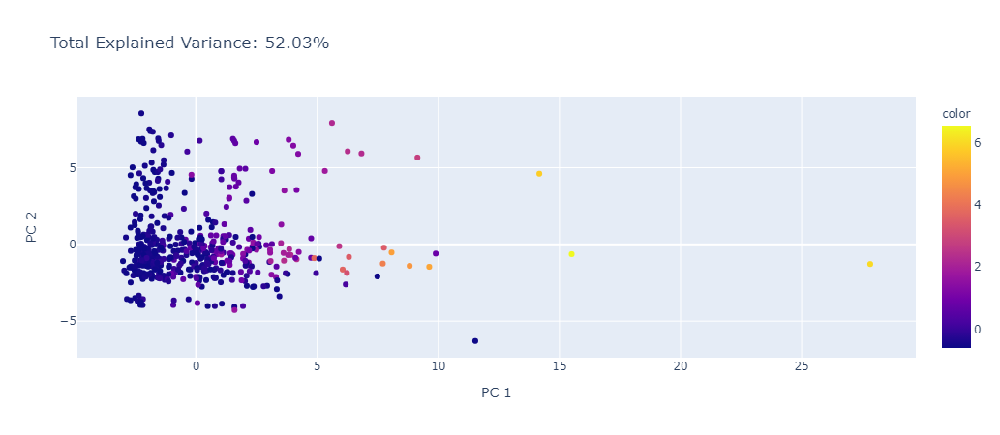

In [112]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(X)
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter(components, x=0, y=1, color=X[:,-1],
                title=f'Total Explained Variance: {total_var:.2f}%',
                labels={'0': 'PC 1', '1': 'PC 2'})
fig.show()

Big Outliers ^^

In [116]:
X=components
X.shape

(520, 2)

In [117]:
# plot distortion
def plot_distortion(X,max_clusters = 10):
    distortions = []
    for i in range(1, max_clusters +1):
        km = KMeans(n_clusters=i,
                    init='k-means++',
                    n_init=15,
                    random_state=0)
        km.fit(X)
        distortions.append(km.inertia_)  # extracts the inertia

    plt.plot(range(1,max_clusters +1), distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.show() 

In [118]:
%matplotlib inline

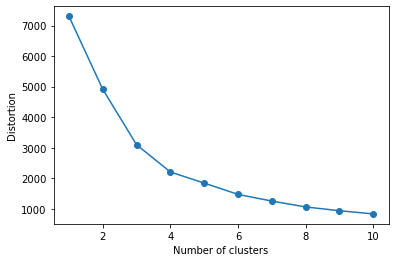

In [119]:
# elbow rule
plot_distortion(X,max_clusters=10)

In [120]:
# elbow rule
km = KMeans(n_clusters=3, # how many clusters we expected 
            n_init=10, # how many initial runs
            random_state=1)

# fit and predict
y_km = km.fit_predict(X)

In [121]:
y_km

array([1, 2, 0, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       2, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 2, 2, 1, 0, 2, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 1, 0, 0, 2, 2, 1, 0, 1, 0, 0, 1, 0,
       1, 1, 2, 0, 0, 0, 2, 0, 0, 1, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 2,
       0, 0, 2, 0, 0, 2, 1, 0, 0, 1, 0, 2, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0,
       2, 1, 0, 2, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       2, 1, 0, 0, 1, 0, 1, 0, 0, 2, 0, 0, 2, 1, 0, 2, 0, 0, 1, 2, 0, 0,
       0, 2, 0, 2, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 0, 1, 0, 0, 0, 1, 0,
       0, 2, 0, 0, 2, 1, 0, 0, 1, 2, 0, 0, 2, 0, 0, 1, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 2, 1, 0, 0, 2, 2, 1, 0, 0, 0, 1, 0, 0, 0, 1, 2,
       0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0,
       0, 0, 1, 2, 0, 0, 1, 0, 0, 2, 0, 0, 1, 2, 0,

In [122]:
def plot_clusters(X,y_res, plt_cluster_centers = False):
    X_centroids = []
    Y_centroids = []

    for cluster in set(y_res):
        x = X[y_res == cluster,0]
        y = X[y_res == cluster,1]
        X_centroids.append(np.mean(x))
        Y_centroids.append(np.mean(y))

        plt.scatter(x,
                    y,
                    s=50,
                    marker='s',
                    label=f'cluster {cluster}')

    if plt_cluster_centers:
        plt.scatter(X_centroids,
                    Y_centroids,
                    marker='*',
                    c='red',
                    s=250,
                    label='centroids')
    plt.legend()
    plt.grid()
    plt.show()

In [123]:
X[y_km[0]][0]

1.6449157428967855

In [124]:
from matplotlib.pyplot import figure

figure(figsize=(8, 6), dpi=80)

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

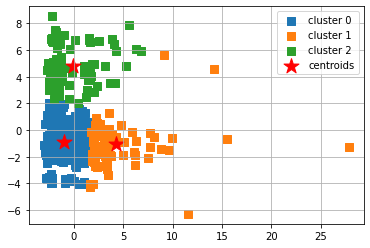

In [125]:
 # plot clustering result
plot_clusters(X, y_km, plt_cluster_centers= True)

In [ ]:
# feature selection improve?

In [126]:
from sklearn.feature_selection import VarianceThreshold

vt = VarianceThreshold(0.1)
df_transformed = vt.fit_transform(df_s)

In [127]:
# remove small variability cols
# columns we have selected
# get_support() is method of VarianceThreshold and stores boolean of each variable in the numpy array.
selected_columns = df_s.columns[vt.get_support()]
# transforming an array back to a data-frame preserves column labels
df_transformed = pd.DataFrame(df_transformed, columns = selected_columns)

In [128]:
df_transformed.shape

(520, 27)

In [129]:
# remove correlated variables
# step 1
df_corr = df_transformed.corr().abs()

# step 2
indices = np.where(df_corr > 0.8) 
indices = [(df_corr.index[x], df_corr.columns[y]) 
            for x, y in zip(*indices)
                if x != y and x < y
          ]

# step 3
for idx in indices: #each pair
    try:
        df_transformed.drop(idx[1], axis = 1, inplace=True)
    except KeyError:
        pass

In [130]:
df_transformed.shape

(520, 17)

In [47]:
df_transformed.describe()

,0,1,2,3,5,7,8,9,11,13,16,18,19,20,22,23,25
count,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02,5.200000e+02
mean,-1.127303e-16,-1.024821e-16,9.564998e-17,-6.832142e-18,3.416071e-18,-4.099285e-17,2.391250e-16,-8.369374e-17,1.605553e-16,2.391250e-17,9.223391e-17,-9.564998e-17,-8.198570e-17,-5.807320e-17,-1.708035e-17,7.515356e-17,-4.782499e-17
std,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00,1.000963e+00
min,-8.875694e-01,-3.000000e+00,-7.655787e-01,-5.739093e-01,-1.267058e+00,-1.070599e+00,-3.872482e+00,-3.165882e+00,-3.166573e+00,-3.920367e-01,-3.187904e-01,-1.469470e+00,-9.519347e-01,-1.489281e+00,-5.320806e-01,-1.083923e+00,-5.800150e-01
25%,-8.875694e-01,3.333333e-01,-7.058434e-01,-5.334945e-01,-5.259429e-01,-7.304152e-01,4.472292e-01,-6.537471e-01,-5.168429e-01,-3.920367e-01,-3.187904e-01,-9.619146e-01,-9.519347e-01,-8.320283e-01,-5.131761e-01,-7.692162e-01,-5.507016e-01
50%,-8.168684e-01,3.333333e-01,-4.121238e-01,-3.585631e-01,-2.468814e-01,-2.711676e-01,4.472292e-01,1.566188e-01,5.095635e-02,-3.920367e-01,-3.187904e-01,-2.005819e-01,-4.130060e-01,-1.747758e-01,-3.644198e-01,-4.545093e-01,-4.269797e-01
75%,1.162759e+00,3.333333e-01,2.345275e-01,1.441322e-01,1.787432e-01,2.901350e-01,4.472292e-01,8.049116e-01,6.187556e-01,-3.920367e-01,-3.187904e-01,1.068306e+00,6.648515e-01,5.920188e-01,1.376600e-01,4.896112e-01,2.777201e-01
max,1.162759e+00,3.333333e-01,9.208027e+00,1.095237e+01,8.255832e+00,3.096648e+00,4.472292e-01,2.182534e+00,3.268486e+00,7.102782e+00,4.690773e+00,1.322083e+00,2.012173e+00,2.089094e+00,1.261513e+01,2.377852e+00,8.983339e+00


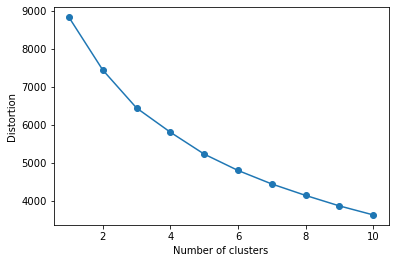

In [166]:
# elbow rule
plot_distortion(df_transformed.values,max_clusters=10)

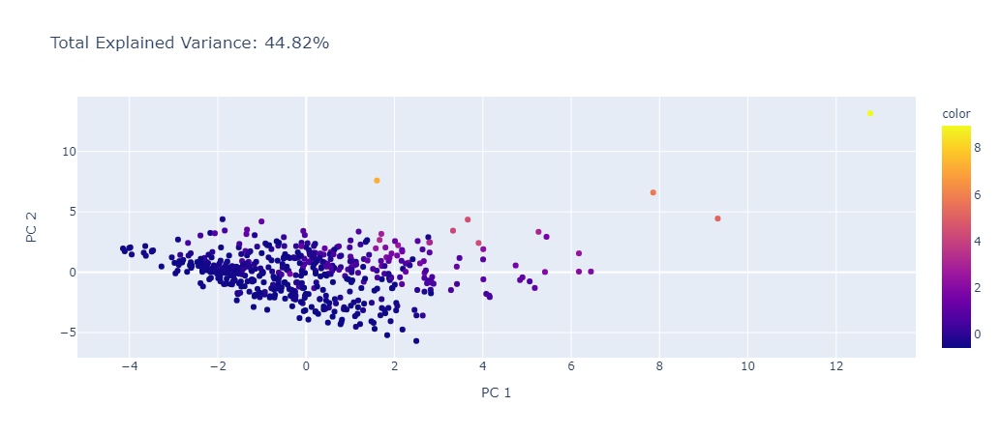

In [167]:
import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
components = pca.fit_transform(df_transformed.values)
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter(components, x=0, y=1, color=df_transformed.values[:,-1],
                title=f'Total Explained Variance: {total_var:.2f}%',
                labels={'0': 'PC 1', '1': 'PC 2'})
fig.show()

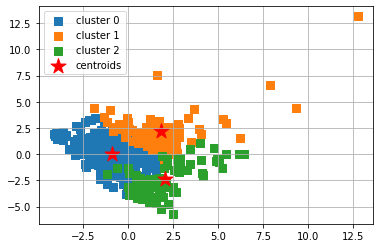

In [169]:
 # plot clustering result
plot_clusters(components, y_km, plt_cluster_centers= True)

In [132]:
X = df_transformed.values

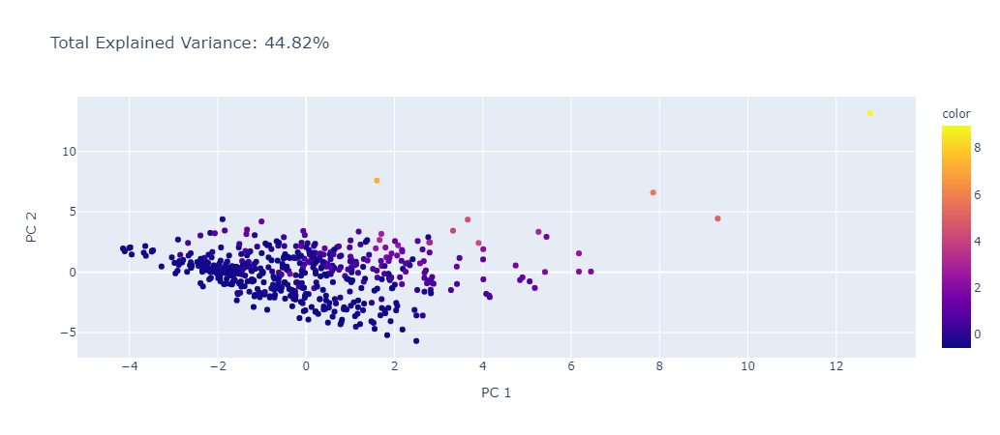

In [133]:
import plotly.express as px
from sklearn.decomposition import PCA


pca = PCA(n_components=2)
components = pca.fit_transform(X)
total_var = pca.explained_variance_ratio_.sum() * 100


fig = px.scatter(components, x=0, y=1, color=X[:,-1],
                title=f'Total Explained Variance: {total_var:.2f}%',
                labels={'0': 'PC 1', '1': 'PC 2'})
fig.show()

^ Worse than before

In [ ]:
df2=df_s.copy()
df2_radar = df2.groupby('clusters').mean().divide(df2.drop('clusters',axis=1).mean())*100
df2_radar

In [138]:
df.head()

,q_minimum_balance,q_account_active,q_starting_balance,q_ending_balance,q_avg_tran_amt,q_avg_credit,q_avg_debit,q_avg_t_per_mo,q_total_t,q_count_t_small,...,q_bal_least_debt,q_mo_least_debt,q_high_t_mo,q_htm_count,q_htm_sbalance,q_htm_ebalance,q_low_t_mo,q_ltm_count,q_ltm_sbalance,q_ltm_ebalance
cust_id,,,,,,,,,,,,,,,,,,,,,
1362548,3000.0,1.0,6004.34,569.65,-54.895859,237.140417,-176.604127,9.900000,99.0,38.0,...,6323.88,10.0,5.0,19.0,4040.87,2974.71,10.0,4.0,17.94,569.65
1362487,3000.0,1.0,2781.07,1401.21,-26.513269,66.647857,-72.242500,4.333333,52.0,30.0,...,2774.53,12.0,6.0,8.0,1868.62,2122.60,1.0,2.0,2771.07,2774.53
1363017,3000.0,1.0,2694.91,147.15,-25.734949,208.597778,-101.653548,33.000000,99.0,26.0,...,2984.87,3.0,1.0,56.0,2596.72,329.05,3.0,14.0,262.73,147.15
1362752,100.0,1.0,487.69,3.76,-5.203548,725.173750,-93.810746,7.750000,93.0,56.0,...,2757.12,12.0,11.0,15.0,629.50,27.52,12.0,2.0,13.76,3.76
1363282,100.0,1.0,133.90,84.18,-0.546374,273.959286,-62.663710,7.583333,91.0,44.0,...,832.82,12.0,2.0,11.0,74.57,140.30,9.0,1.0,144.41,144.41


In [136]:
import copy
df2 = df.copy()

In [140]:
df2['clusters'] = pd.Series(km.labels_)

In [141]:
df2_radar =df2.groupby('clusters').mean().divide(df2.drop('clusters',axis=1).mean())*100

In [143]:
df2_radar

,q_minimum_balance,q_account_active,q_starting_balance,q_ending_balance,q_avg_tran_amt,q_avg_credit,q_avg_debit,q_avg_t_per_mo,q_total_t,q_count_t_small,...,q_bal_least_debt,q_mo_least_debt,q_high_t_mo,q_htm_count,q_htm_sbalance,q_htm_ebalance,q_low_t_mo,q_ltm_count,q_ltm_sbalance,q_ltm_ebalance
clusters,,,,,,,,,,,,,,,,,,,,,


In [145]:
df_s.head()

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,clusters
0,1.162759,0.333333,1.417594,-0.075941,-1.439032,-0.141139,-0.931617,-0.692145,0.447229,-0.167528,...,0.814528,0.125923,-0.832028,0.966329,1.369376,1.748439,-0.471221,-0.571994,-0.323818,1
1,1.162759,0.333333,0.225710,0.650980,-0.367437,-0.950621,0.386352,-0.928856,-1.624469,-0.815820,...,1.322083,0.395387,-1.233683,0.074696,0.824701,-1.083923,-0.554424,0.658946,0.789041,2
2,1.162759,0.333333,0.193850,-0.445276,-0.338052,-0.276657,0.014924,0.290135,0.447229,-1.139967,...,-0.961915,-0.951935,0.518991,0.373556,-0.321749,-0.454509,-0.055202,-0.462547,-0.537064,0
3,-0.887569,0.333333,-0.622324,-0.570622,0.437118,2.175993,0.113969,-0.783569,0.182757,1.291131,...,1.322083,1.742709,-0.978084,-0.433920,-0.514490,2.377852,-0.554424,-0.573863,-0.609436,0
4,-0.887569,0.333333,-0.753147,-0.500322,0.612952,0.033673,0.507321,-0.790656,0.094600,0.318692,...,1.322083,-0.682470,-1.124140,-0.661700,-0.442400,1.433732,-0.596026,-0.515448,-0.538447,0


In [148]:
df_sR = df_s.groupby('clusters').mean().divide(df_s.drop('clusters',axis=1).mean())*100

In [149]:
df_sR

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
clusters,,,,,,,,,,,,,,,,,,,,,
0,2.003725e+17,-1.019333e+16,-3.415322e+17,3.651922e+18,1.370260e+18,-6.075089e+17,-4.092277e+17,-5.699057e+17,1.701170e+17,-5.476759e+17,...,8.800400e+17,2.656402e+17,2.546743e+17,-3.811827e+17,4.411841e+17,1.419929e+18,-1.239851e+17,1.030276e+18,6.016335e+17,-5.500663e+17
1,-9.261773e+17,-5.421000e+16,1.655878e+18,-1.059643e+19,-6.513502e+18,1.848694e+19,2.346222e+18,1.671780e+17,1.481857e+17,8.479738e+17,...,-4.687256e+18,6.125175e+16,-5.185921e+16,-4.004075e+17,-2.154916e+18,-5.122904e+18,-3.106509e+17,-6.812791e+17,-2.561686e+18,2.209835e+18
2,8.786044e+16,9.566470e+16,-2.260699e+17,-4.608527e+18,7.785055e+17,-1.576079e+19,-6.287501e+17,2.188164e+18,-8.489257e+17,1.423582e+18,...,9.980645e+17,-1.157469e+18,-1.000406e+18,1.969757e+18,3.077334e+17,-8.008360e+17,8.189818e+17,-3.581170e+18,4.715579e+16,8.761383e+16


In [153]:
variable_means_list = []
for index, rows in df_sR.iterrows(): 
    my_list =[rows[i] for i in df_sR.columns]
    variable_means_list.append(my_list) 
    #print(index)
    #print(rows)
    
variable_means_list

[[2.003725135932865e+17,
  -1.0193332489933118e+16,
  -3.415322137208339e+17,
  3.651921740786768e+18,
  1.3702597212864067e+18,
  -6.075089017644348e+17,
  -4.092277025012237e+17,
  -5.699056675832736e+17,
  1.7011704425130707e+17,
  -5.476759448391066e+17,
  -2.377775652453605e+17,
  4.0469588920211096e+16,
  -1.61181982273895e+18,
  -2.6431439274674634e+17,
  -2.2429534428216246e+17,
  -inf,
  4.1217064052090744e+16,
  8.800399793803215e+17,
  2.6564023163751344e+17,
  2.546743011686796e+17,
  -3.811826659382511e+17,
  4.411841089766072e+17,
  1.4199287202058079e+18,
  -1.2398511782245205e+17,
  1.0302760163823194e+18,
  6.016334801739773e+17,
  -5.50066311204742e+17],
 [-9.261772611522728e+17,
  -5.420999551464494e+16,
  1.6558780047525092e+18,
  -1.0596425623908393e+19,
  -6.513501579549695e+18,
  1.8486941825168245e+19,
  2.346222384927701e+18,
  1.6717803240183885e+17,
  1.481857341531096e+17,
  8.479738460028093e+17,
  -1.1179769499594806e+18,
  5.243174690187268e+17,
  -2.9175

In [ ]:
categories=df_sR.columns

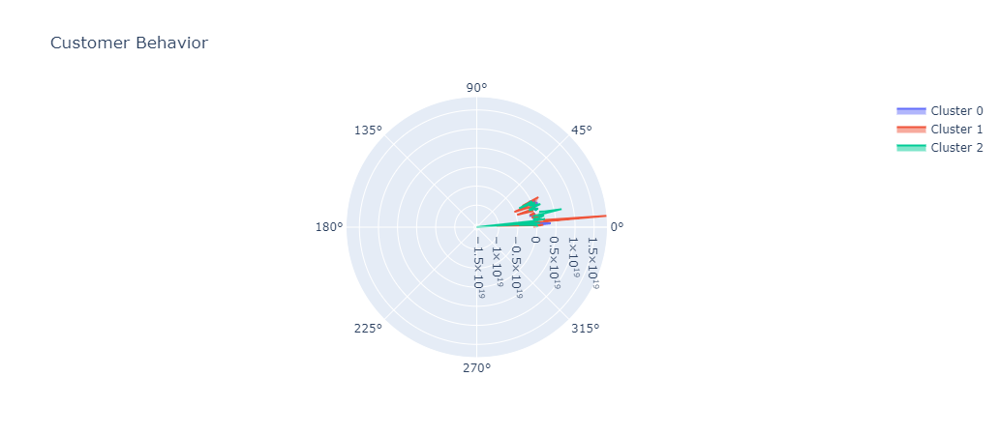

In [154]:
categories=df_sR.columns

# Radar Plot Code
import plotly.graph_objects as go
categories = categories
fig = go.Figure()

fig.add_trace(go.Scatterpolar(
        r= variable_means_list[0],
        theta=categories,
        fill='toself',
        name='Cluster 0'))
fig.add_trace(go.Scatterpolar(
        r= variable_means_list[1],
        theta=categories,
        fill='toself',
        name='Cluster 1'))
fig.add_trace(go.Scatterpolar(
        r= variable_means_list[2],
        theta=categories,
        fill='toself',
        name='Cluster 2'))

fig.layout = go.Layout(
    title = 'Customer Behavior')
plt.figsize=(12, 12)
fig.show()

/home/aris/miniconda3/envs/lhl/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:>

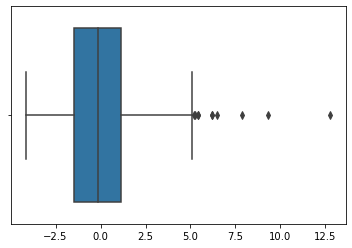

In [159]:
sns.boxplot(components[:,0])

/home/aris/miniconda3/envs/lhl/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:>

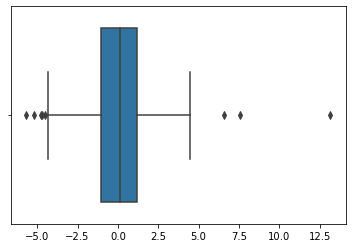

In [160]:
sns.boxplot(components[:,1])

In [163]:
components2 = components[(components[:,0] < 10.0) & (components[:,1] < 10.0)]

In [165]:
total_var = pca.explained_variance_ratio_.sum() * 100


fig = px.scatter(components2, x=0, y=1, color=components2[:,:-1],
                title=f'Total Explained Variance: {total_var:.2f}%',
                labels={'0': 'PC 1', '1': 'PC 2'})
fig.show()

ValueError: Data must be 1-dimensional

In [ ]:
# fill zero
df['q_avg_credit'].fillna(value=0, inplace=True)
df['q_avg_debit'].fillna(value=0, inplace=True)
df['q_count_t_large'].fillna(value=0, inplace=True)
df['q_count_credit'].fillna(value=0, inplace=True)
df['q_count_debit'].fillna(value=0, inplace=True)
df['q_days_zero'].fillna(value=0, inplace=True)
df['c_credit_limit'].fillna(value=0, inplace=True)
df['c_credit_rating'].fillna(value=0, inplace=True)
df['c_account_active'].fillna(value=0, inplace=True)
df['c_starting_balance'].fillna(value=0, inplace=True)
df['c_ending_balance'].fillna(value=0, inplace=True)
df['c_avg_tran_amt'].fillna(value=0, inplace=True)
df['c_avg_credit'].fillna(value=0, inplace=True)
df['c_avg_debit'].fillna(value=0, inplace=True)
df['c_avg_t_per_mo'].fillna(value=0, inplace=True)
df['c_total_t'].fillna(value=0, inplace=True)
df['c_count_t_small'].fillna(value=0, inplace=True)
df['c_count_credit'].fillna(value=0, inplace=True)
df['c_count_debit'].fillna(value=0, inplace=True)
df['c_days_zero'].fillna(value=0, inplace=True)
df['c_days_not_zero'].fillna(value=0, inplace=True)
df['c_bal_most_debt'].fillna(value=0, inplace=True) # not 0
df['c_mo_most_debt'].fillna(value=0, inplace=True)
df['c_bal_least_debt'].fillna(value=0, inplace=True) # not 0

In [182]:
[df_master[col].fillna(value=0, inplace=True) for col in have_nulls]

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [186]:
[df_master[col].fillna(value=np.mean(df_master[col]), inplace=True) for col in have_nulls]

[None, None, None, None, None, None]

In [23]:
pd.options.display.max_rows = 100
pd.options.display.max_columns = None

In [26]:
len(df_master.dtypes[df_master.dtypes!='object'].index) == len(df_master.columns)

True

In [187]:
df_master[df_master.q_avg_credit.isnull()]

,q_minimum_balance,q_account_active,q_starting_balance,q_ending_balance,q_avg_tran_amt,q_avg_credit,q_avg_debit,q_avg_t_per_mo,q_total_t,q_count_t_small,q_count_t_large,q_count_credit,q_count_debit,q_days_zero,q_days_not_zero,q_bal_most_debt,q_mo_most_debt,q_bal_least_debt,q_mo_least_debt,q_high_t_mo,q_htm_count,q_htm_sbalance,q_htm_ebalance,q_low_t_mo,q_ltm_count,q_ltm_sbalance,q_ltm_ebalance,c_credit_limit,c_credit_rating,c_account_active,c_starting_balance,c_ending_balance,c_avg_tran_amt,c_avg_credit,c_avg_debit,c_avg_t_per_mo,c_total_t,c_count_t_small,c_count_t_large,c_count_credit,c_count_debit,c_days_zero,c_days_not_zero,c_bal_most_debt,c_mo_most_debt,c_bal_least_debt,c_mo_least_debt,c_high_t_mo,c_htm_count,c_htm_sbalance,c_htm_ebalance,c_low_t_mo,c_ltm_count,c_ltm_sbalance,c_ltm_ebalance,s_minimum_balance,s_account_active,s_starting_balance,s_ending_balance,s_acct_type_BS,s_acct_type_MM,s_avg_tran_amt,s_avg_credit,s_avg_debit,s_avg_t_per_mo,s_total_t,s_count_t_small,s_count_t_large,s_count_credit,s_count_debit,s_days_zero,s_days_not_zero,s_bal_most_debt,s_mo_most_debt,s_bal_least_debt,s_mo_least_debt,s_high_t_mo,s_htm_count,s_htm_sbalance,s_htm_ebalance,s_low_t_mo,s_ltm_count,s_ltm_sbalance,s_ltm_ebalance
cust_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


df_master

In [217]:
df.isnull().any()

q_minimum_balance     False
q_account_active      False
q_starting_balance    False
q_ending_balance      False
q_avg_tran_amt        False
q_avg_credit          False
q_avg_debit           False
q_avg_t_per_mo        False
q_total_t             False
q_count_t_small       False
q_count_t_large       False
q_count_credit        False
q_count_debit         False
q_days_zero           False
q_days_not_zero       False
q_bal_most_debt       False
q_mo_most_debt        False
q_bal_least_debt      False
q_mo_least_debt       False
q_high_t_mo           False
q_htm_count           False
q_htm_sbalance        False
q_htm_ebalance        False
q_low_t_mo            False
q_ltm_count           False
q_ltm_sbalance        False
q_ltm_ebalance        False
dtype: bool

In [ ]:
X = df_master.

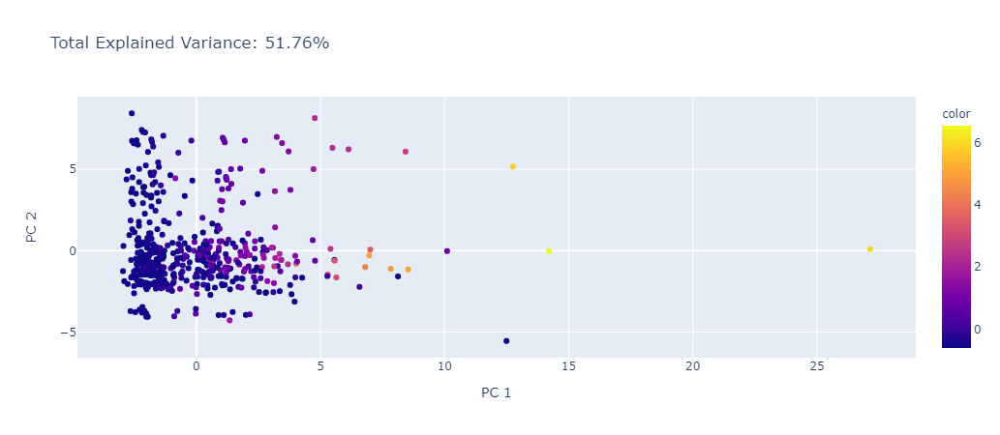

In [220]:
import plotly.express as px
from sklearn.decomposition import PCA


pca = PCA(n_components=2)
components = pca.fit_transform(X[:,:-1])
total_var = pca.explained_variance_ratio_.sum() * 100


fig = px.scatter(components, x=0, y=1, color=X[:,-1],
                title=f'Total Explained Variance: {total_var:.2f}%',
                labels={'0': 'PC 1', '1': 'PC 2'})
fig.show()

### Scaling ect...

In [218]:
#define standard scaler
scaler = StandardScaler()

#transform data
temp_array=scaler.fit_transform(df) 
df_s=pd.DataFrame(temp_array)
df_s

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26
0,1.162759,0.333333,1.417594,-0.075941,-1.439032,-0.141139,-0.931617,-0.692145,0.447229,-0.167528,0.694244,1.375821,0.406266,-0.392037,0.465223,-0.252027,-0.31879,1.277321,0.814528,0.125923,-0.832028,0.966329,1.369376,1.748439,-0.471221,-0.571994,-0.323818
1,1.162759,0.333333,0.225710,0.650980,-0.367437,-0.950621,0.386352,-0.928856,-1.624469,-0.815820,-1.522614,-0.516843,-1.513137,-0.392037,-1.584175,1.249032,-0.31879,-0.014774,1.322083,0.395387,-1.233683,0.074696,0.824701,-1.083923,-0.554424,0.658946,0.789041
2,1.162759,0.333333,0.193850,-0.445276,-0.338052,-0.276657,0.014924,0.290135,0.447229,-1.139967,1.376354,0.240223,0.344350,-0.392037,0.465223,-0.267879,-0.31879,0.061798,-0.961915,-0.951935,0.518991,0.373556,-0.321749,-0.454509,-0.055202,-0.462547,-0.537064
3,-0.887569,0.333333,-0.622324,-0.570622,0.437118,2.175993,0.113969,-0.783569,0.182757,1.291131,-0.669977,-1.652442,0.653931,0.357445,0.159994,-0.271519,-0.31879,-0.021112,1.322083,1.742709,-0.978084,-0.433920,-0.514490,2.377852,-0.554424,-0.573863,-0.609436
4,-0.887569,0.333333,-0.753147,-0.500322,0.612952,0.033673,0.507321,-0.790656,0.094600,0.318692,-0.101551,-0.516843,0.344350,0.357445,0.072785,-0.271519,-0.31879,-0.721628,1.322083,-0.682470,-1.124140,-0.661700,-0.442400,1.433732,-0.596026,-0.515448,-0.538447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
515,1.162759,0.333333,0.734117,-0.522797,-0.929075,-0.103353,-0.462991,0.290135,0.447229,-1.058930,1.319512,0.240223,0.282433,-0.392037,0.465223,-0.271074,-0.31879,0.548457,-0.961915,-0.682470,0.482477,-0.559313,-0.531819,-0.454509,-0.429619,-0.579832,-0.581823
516,-0.816868,0.333333,-0.727854,0.362208,0.964824,-0.420442,0.529468,-0.586900,0.447229,0.885948,-0.044709,1.375821,-0.027148,-0.392037,0.465223,-0.269585,-0.31879,-0.630102,0.306973,0.125923,-0.868542,-0.613257,-0.530534,1.119025,-0.304813,-0.403480,-0.070839
517,1.162759,0.333333,0.680289,1.458848,-0.812158,-1.044125,0.138212,-0.957204,-1.977099,-1.545150,-1.465772,-0.327577,-1.884635,-0.392037,-1.933008,2.251907,-0.31879,0.433775,1.322083,2.012173,-1.270197,0.326012,0.954313,-0.769216,-0.596026,1.037456,1.214584
518,-0.816868,0.333333,-0.459852,-0.533278,0.297752,0.755971,-0.312939,-0.411493,0.447229,0.885948,-0.044709,0.240223,0.653931,-0.392037,0.465223,-0.269085,-0.31879,-0.280783,-0.200582,0.125923,-0.138262,-0.691389,0.325333,-0.454509,-0.596026,-0.163961,-0.141662


In [137]:
X

array([[ 1.16275942,  0.33333333,  1.41759449, ..., -0.47122066,
        -0.57199388, -0.32381762],
       [ 1.16275942,  0.33333333,  0.22571017, ..., -0.55442431,
         0.65894567,  0.78904056],
       [ 1.16275942,  0.33333333,  0.19385036, ..., -0.05520242,
        -0.46254693, -0.53706395],
       ...,
       [ 1.16275942,  0.33333333,  0.68028924, ..., -0.59602613,
         1.03745624,  1.21458434],
       [-0.81686841,  0.33333333, -0.45985248, ..., -0.59602613,
        -0.16396094, -0.14166235],
       [ 1.16275942,  0.33333333,  0.22885325, ..., -0.55442431,
         0.66274606,  0.79333577]])

In [ ]:
# add credit account (y/n), savings, chequings 

In [59]:
df_master.isnull().sum() #q_count_t_large, q_days_zero, 
#q_avg_credit, q_avg_debit

q_minimum_balance       0
q_account_active        0
q_starting_balance      0
q_ending_balance        0
q_avg_tran_amt          0
q_avg_credit            3
q_avg_debit             3
q_avg_t_per_mo          0
q_total_t               0
q_count_t_small         0
q_count_t_large        11
q_count_credit          3
q_count_debit           3
q_days_zero           415
q_days_not_zero         0
q_bal_most_debt         0
q_mo_most_debt          0
q_bal_least_debt        0
q_mo_least_debt         0
q_high_t_mo             0
q_htm_count             0
q_htm_sbalance          0
q_htm_ebalance          0
q_low_t_mo              0
q_ltm_count             0
q_ltm_sbalance          0
q_ltm_ebalance          0
c_credit_limit        136
c_credit_rating       136
c_account_active      136
c_starting_balance    136
c_ending_balance      136
c_avg_tran_amt        147
c_avg_credit          152
c_avg_debit           162
c_avg_t_per_mo        147
c_total_t             147
c_count_t_small       206
c_count_t_la

## Mini Project III
https://github.com/lighthouse-labs/mini-project-III

In [3]:
import os
import numpy as np
import pandas as pd

In [4]:
import sqlite3
from sqlite3 import Error

def create_connection(path):
    connection = None
    try:
        connection = sqlite3.connect(path)
        print("Connection to SQLite DB successful")
    except Error as e:
        print(f"The error '{e}' occurred")

    return connection

In [5]:
connection = create_connection("./data.sqlite")

Connection to SQLite DB successful


### Data
We will be using old data about different financial transactions. You can download the data from [here](https://drive.google.com/file/d/1zAjnf936aHkwVCq_BmA47p4lpRjyRzMf/view?usp=sharing). The data contains following tables:

- twm_customer - information about customers
- twm_accounts - information about accounts
- twm_checking_accounts - information about checking accounts (subset of twm_accounts)
- twm_credit_accounts - information about checking accounts (subset of twm_accounts)
- twm_savings_accounts - information about checking accounts (subset of twm_accounts)
- twm_transactions - information about financial transactions
- twm_savings_tran - information about savings transactions (subset of twm_transactions)
- twm_checking_tran - information about savings transactions (subset of twm_transactions)
- twm_credit_tran - information about credit checking (subset of twm_transactions)


### Output

In this miniproject, we will:

1.  create two separate customer segmentations (using clustering) to split them into 3-5 clusters: 
    - based on demographics (only on the information from twm_customer)
    - based on their banking behavior. We can take following things into consideration as banking behavior:
        - do they have savings account? How much do they save?
        - do they have credit account? How much do they live in debt?
        - are they making lot of small transactions or few huge ones?
2. visualize the created clusters using [radar charts](https://plotly.com/python/radar-chart/) and compare them agains each other
3. visualize segmentations using scatter plot. We will have to use PCA to be able to plot our observations in 2D.
4. (stretch) visualize in 2D how our clusters are evolving in each iteration of KMeans (for at least 20 iterations).
    - we will need to create own implementation of kmeans so we can see what is happening with the clusters during the iterations.


In [6]:
# add tables as variables
files = [file for file in os.listdir('data') if file.startswith('twm')]
for file in files:
    var_name = file.split('.')[0][4:]
    cmd = f"{var_name} = pd.read_csv('data/{file}', sep=';')"
    print(var_name)
    exec(cmd)

accounts
checking_acct
savings_tran
credit_acct
savings_acct
credit_tran
checking_tran
customer
transactions


In [7]:
# export to sql DB
accounts.to_sql('accounts', connection, if_exists='replace')
checking_acct.to_sql('checking_acct', connection, if_exists='replace')
savings_tran.to_sql('savings_tran', connection, if_exists='replace')
credit_acct.to_sql('credit_acct', connection, if_exists='replace')
savings_acct.to_sql('savings_acct', connection, if_exists='replace')
credit_tran.to_sql('credit_tran', connection, if_exists='replace')
checking_tran.to_sql('checking_tran', connection, if_exists='replace')
customer.to_sql('customer', connection, if_exists='replace')
transactions.to_sql('transactions', connection, if_exists='replace')

In [9]:
def convert_date(df, col):
    from datetime import datetime
    df[col] = pd.to_datetime(df[col], format='%d.%m.%Y')
    df['month'] = df[col].apply(lambda x: x.month)
    df['day'] = df[col].apply(lambda x: x.day)
    return print(f'converted column "{col}"; added mo & day cols')

In [10]:
# all cust_id values are unique
checking_acct.cust_id.nunique() == checking_acct.cust_id.count()

True

In [11]:
# same num rows between all dfs
len(credit_tran.columns) == len(savings_tran.columns) == len(checking_tran.columns)

True

# Designing Feature Extraction

In [12]:
df = checking_tran

In [13]:
# test w credit_tran
df = credit_tran

In [14]:
convert_date(df, 'tran_date')

converted column "tran_date"; added mo & day cols


In [15]:
df.sort_values(['cust_id', 'tran_id'], inplace=True)

In [16]:
avg_tran_amt = df.groupby(['cust_id']).mean().tran_amt

In [17]:
avg_credit = df[df.tran_amt > 0].groupby('cust_id').mean().tran_amt #avg_save

In [18]:
avg_debit = df[df.tran_amt < 0].groupby('cust_id').mean().tran_amt

In [19]:
avg_t_per_mo = df.groupby(['cust_id', 'month']).count().reset_index().groupby('cust_id').mean().tran_id

In [20]:
total_t = df.groupby('cust_id').count().tran_id

In [21]:
df.tran_amt.describe()

count    20167.000000
mean         0.773537
std        455.914969
min      -1565.500000
25%       -166.790000
50%        -67.510000
75%          0.000000
max      17464.520000
Name: tran_amt, dtype: float64

In [22]:
count_t_small = df[abs(df.tran_amt) < abs(df.tran_amt.mean())].groupby('cust_id').tran_id.count()

In [23]:
count_t_large = df[abs(df.tran_amt) > abs(df.tran_amt.mean())].groupby('cust_id').tran_id.count()

In [24]:
count_credit = df[df.tran_amt > 0].groupby('cust_id').count().tran_amt #count_save

In [25]:
count_debit = df[df.tran_amt < 0].groupby('cust_id').count().tran_amt

In [95]:
days_zero = df[df.new_balance == 0].groupby('cust_id').count().tran_id

In [101]:
days_not_zero = df[df.new_balance != 0].groupby('cust_id').count().tran_id

______
**Note** credits never above zero, and bank accounts never below

In [28]:
credit_tran[credit_tran.new_balance > 0].groupby('cust_id').count()

,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day
cust_id,,,,,,,,,,,


In [29]:
checking_tran[checking_tran.new_balance < 0].groupby('cust_id').count()

,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code
cust_id,,,,,,,,,


In [30]:
savings_tran[savings_tran.new_balance < 0].groupby('cust_id').count()

,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code
cust_id,,,,,,,,,


__________

In [31]:
bal_most_debt = df.groupby('cust_id').new_balance.min()

In [32]:
mo_most_debt = df.groupby(['cust_id','month']).new_balance.min().reset_index().groupby('cust_id').min().month

____
## Begin crazy effort for:
Number of consecutive days with static balance

In [33]:
def days_static(df):
    return df.assign(days_static=np.where((df['cust_id'].eq(df['cust_id'].shift().bfill())) & (df['new_balance'].diff() == 0), 1, 0))

In [34]:
df = days_static(df)

In [35]:
def days_static_2(df):
    df.sort_values(['cust_id', 'tran_id'], inplace=True)
    df.reset_index(inplace=True)
    for index, row in df.iterrows():
        if row.days_static == 1:
            df.loc[index-1,'days_static'] = 1
    df.set_index('index', inplace = True)
    df.index.name = None
    df['days_static'] = df.days_static.astype(bool)
    return df

In [36]:
days_static_2(df)

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,days_static
1098,1362480,1,163.00,140.36,22.64,-1467.04,1995-01-03,170031,C,PM,1,3,False
8469,1362480,2,-200.00,-200.00,0.00,-1667.04,1995-01-04,15411,A,CA,1,4,False
16275,1362480,3,-225.14,-225.14,0.00,-1892.18,1995-01-04,163918,E,CG,1,4,False
3845,1362480,4,-607.82,-607.82,0.00,-2500.00,1995-01-20,153058,E,CG,1,20,False
11774,1362480,5,252.07,231.41,20.66,-2268.59,1995-02-02,,M,PM,2,2,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
509,1363492,25,719.12,627.97,91.15,-6472.03,1995-10-05,,M,PM,10,5,False
3866,1363492,26,656.32,565.17,91.15,-5906.86,1995-11-05,,M,PM,11,5,False
7190,1363492,27,-1193.14,-1193.14,0.00,-7100.00,1995-11-14,131100,E,CG,11,14,False
10708,1363492,28,718.32,635.13,83.19,-6464.87,1995-12-07,,M,PM,12,7,False


**Repair following code!!**

In [37]:
subframe = df[df['days_static'] == True].sort_values(['cust_id', 'new_balance', 'tran_date'])[['cust_id', 'new_balance', 'tran_date']].reset_index()

results = []
start = None
end = None

for index, row in subframe.iterrows():
    cust_id = row['cust_id']
    new_bal = row['new_balance']
    
    if not start:
        start = row['tran_date']
    try:
        next_row = subframe.iloc[index + 1]
    except:
        next_row = None
    
    if next_row is not None:
        if next_row['new_balance'] != new_bal or next_row['cust_id'] != cust_id:
            end = row['tran_date']
    
    if cust_id and new_bal and start and end:
        number_of_days = abs((start - end).days)
        row = [cust_id, new_bal, start, end, number_of_days]
        results.append(row)
        cust_id, new_bal, start, end = None, None, None, None

results_df = pd.DataFrame(columns=['cust_id', 'new_bal', 'start', 'end', 'number_of_days'], data=results)

In [38]:
results_df

,cust_id,new_bal,start,end,number_of_days
0,1362480,-2500.00,1995-04-09,1995-09-02,146
1,1362484,-629.40,1995-07-17,1995-07-21,4
2,1362484,-168.17,1995-06-12,1995-06-30,18
3,1362485,-1100.00,1995-09-02,1995-09-07,5
4,1362485,-1100.00,1995-07-23,1995-07-23,0
...,...,...,...,...,...
1228,1363485,-240.00,1995-11-19,1995-11-19,0
1229,1363485,-160.00,1995-12-15,1995-12-21,6
1230,1363485,-140.00,1995-12-11,1995-12-15,4
1231,1363492,-6466.65,1995-01-03,1995-12-29,360


In [39]:
days_most_debt = results_df.groupby(['cust_id']).nth(0).number_of_days

In [40]:
days_least_debt = results_df.sort_values('new_bal', ascending=False).groupby(['cust_id']).nth(0).number_of_days

In [41]:
avg_d_static_balance = results_df.groupby('cust_id').number_of_days.mean()

In [42]:
longest_d_static_balance = results_df.groupby('cust_id').number_of_days.max()

In [43]:
shortest_d_static_balance = results_df.groupby('cust_id').number_of_days.min()

## End
crazy high effort find 
_______

In [44]:
bal_least_debt = df.groupby('cust_id').new_balance.max()

In [45]:
mo_least_debt = df.groupby(['cust_id','month']).new_balance.max().reset_index().groupby('cust_id').max().month

In [105]:
high_t_mo = df.groupby(['cust_id','month']).count().reset_index().sort_values('tran_id',ascending=False).groupby('cust_id').nth(0).month

In [47]:
htm_count = df.groupby(['cust_id','month']).count().reset_index().groupby('cust_id').tran_id.max()

In [48]:
c_id = high_t_mo.index.values
c_mo = high_t_mo.values
d = dict.fromkeys(df.columns)

for i in range(len(c_id)):
    rows = df[(df['cust_id'] == c_id[i]) & (df['month'] == c_mo[i])]
    for col in rows:
        if d[col] == None:
            d[col] = rows[col].values.tolist()
        else:
            for i in rows[col].values.tolist():
                d[col].append(i)

high_mo = pd.DataFrame(d)

In [49]:
high_mo.head()

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,days_static
0,1362480,1,163.00,140.36,22.64,-1467.04,789091200000000000,170031,C,PM,1,3,False
1,1362480,2,-200.00,-200.00,0.00,-1667.04,789177600000000000,15411,A,CA,1,4,False
2,1362480,3,-225.14,-225.14,0.00,-1892.18,789177600000000000,163918,E,CG,1,4,False
3,1362480,4,-607.82,-607.82,0.00,-2500.00,790560000000000000,153058,E,CG,1,20,False
4,1362484,42,262.93,262.93,0.00,0.00,815184000000000000,164703,A,PM,11,1,False


In [50]:
htm_sbalance = high_mo.groupby('cust_id').nth(0).new_balance

In [51]:
htm_ebalance = high_mo.sort_values('tran_id', ascending=False).groupby('cust_id').nth(0).new_balance

In [52]:
low_t_mo = df.groupby(['cust_id','month']).count().reset_index().sort_values('tran_id').groupby('cust_id').nth(0).month

In [53]:
ltm_count = df.groupby(['cust_id','month']).count().reset_index().groupby('cust_id').tran_id.min()

In [150]:
c_id = low_t_mo.index.values
c_mo = low_t_mo.values
d = dict.fromkeys(df.columns)

for i in range(len(c_id)):
    rows = df[(df['cust_id'] == c_id[i]) & (df['month'] == c_mo[i])]
    for col in rows:
        if d[col] == None:
            d[col] = rows[col].values.tolist()
        else:
            for i in rows[col].values.tolist():
                d[col].append(i)

low_mo = pd.DataFrame(d)

In [151]:
ltm_sbalance = low_mo.groupby('cust_id').nth(0).new_balance

In [156]:
high_mo = month_select(high_t_mo)

In [157]:
high_mo

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,days_static
0,1362480,1,163.00,140.36,22.64,-1467.04,789091200000000000,170031,C,PM,1,3,False
1,1362480,2,-200.00,-200.00,0.00,-1667.04,789177600000000000,15411,A,CA,1,4,False
2,1362480,3,-225.14,-225.14,0.00,-1892.18,789177600000000000,163918,E,CG,1,4,False
3,1362480,4,-607.82,-607.82,0.00,-2500.00,790560000000000000,153058,E,CG,1,20,False
4,1362484,42,262.93,262.93,0.00,0.00,815184000000000000,164703,A,PM,11,1,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3771,1363492,7,-160.00,-160.00,0.00,-5949.69,794361600000000000,94855,A,CA,3,5,True
3772,1363492,8,0.00,0.00,0.00,-5949.69,794361600000000000,94942,A,IQ,3,5,True
3773,1363492,9,585.59,519.34,66.25,-5430.35,794448000000000000,161101,E,PM,3,6,False
3774,1363492,10,-316.06,-316.06,0.00,-5746.41,794707200000000000,192934,E,CG,3,9,False


In [81]:
ltm_ebalance = low_mo.sort_values('tran_id', ascending=False).groupby('cust_id').nth(0).new_balance.rename('ltm_ebalance')

In [82]:
ltm_ebalance.name

'ltm_ebalance'

## Put into function!

In [270]:
df

,c_acct_nbr,c_credit_limit,c_credit_rating,c_account_active,c_acct_start_date,c_acct_end_date,c_starting_balance,c_ending_balance,c_avg_tran_amt,c_avg_credit,...,c_bal_least_debt,c_mo_least_debt,c_high_t_mo,c_htm_count,c_htm_sbalance,c_htm_ebalance,c_low_t_mo,c_ltm_count,c_ltm_sbalance,c_ltm_ebalance
cust_id,,,,,,,,,,,,,,,,,,,,,
1363160,4561143213631600,1000,0,Y,12.10.1988,NaN,657.46,286.69,5.588676,536.957500,...,0.00,12.0,10.0,9.0,-873.16,-774.71,2.0,2.0,0.00,-180.00
1362487,4561143213624870,3000,0,Y,8.8.1995,NaN,0.00,1548.23,-47.987187,404.702500,...,-254.98,12.0,12.0,11.0,-897.63,-1548.23,8.0,3.0,-254.98,-600.71
1362548,4561143213625480,6700,0,Y,11.11.1986,NaN,6965.25,68.68,317.147727,1379.202500,...,0.00,12.0,9.0,3.0,-158.34,-576.16,7.0,1.0,0.00,0.00
1362752,4561143213627520,2400,0,N,9.10.1994,2.4.1995,2302.14,0.00,160.443333,1073.662500,...,0.00,4.0,3.0,5.0,-1918.26,-2400.00,4.0,1.0,0.00,0.00
1363017,4561143213630170,1000,0,Y,8.2.1995,NaN,0.00,1000.00,-15.176190,460.831000,...,0.00,12.0,10.0,9.0,-364.76,-1000.00,2.0,2.0,0.00,-66.57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1363364,4561143213633640,3000,0,N,23.11.1989,23.7.1995,1783.86,1785.97,0.247333,1105.415714,...,0.00,7.0,2.0,15.0,-1458.32,-1222.54,5.0,7.0,-973.45,-395.08
1363467,4561143213634670,1500,0,Y,30.6.1993,NaN,1193.89,1500.00,-2.547027,689.046667,...,-291.38,12.0,9.0,11.0,-620.91,-1500.00,2.0,3.0,-1120.58,-1500.00
1363263,4561143213632630,3000,0,Y,29.3.1995,NaN,0.00,1218.94,-16.038684,671.000000,...,0.00,12.0,6.0,13.0,-851.54,-1156.50,3.0,1.0,-76.85,-76.85


In [266]:
['c_'+df[col].name for col in df.columns]

df.rename(columns={col:col.upper().replace(" ","_")},inplace=True)

['c_acct_nbr',
 'c_credit_limit',
 'c_credit_rating',
 'c_account_active',
 'c_acct_start_date',
 'c_acct_end_date',
 'c_starting_balance',
 'c_ending_balance',
 'c_avg_tran_amt',
 'c_avg_credit',
 'c_avg_debit',
 'c_avg_t_per_mo',
 'c_total_t',
 'c_count_t_small',
 'c_count_t_large',
 'c_count_credit',
 'c_count_debit',
 'c_days_zero',
 'c_days_not_zero',
 'c_bal_most_debt',
 'c_mo_most_debt',
 'c_bal_least_debt',
 'c_mo_least_debt',
 'c_high_t_mo',
 'c_htm_count',
 'c_htm_sbalance',
 'c_htm_ebalance',
 'c_low_t_mo',
 'c_ltm_count',
 'c_ltm_sbalance',
 'c_ltm_ebalance']

In [265]:
df.columns

Index(['acct_nbr', 'credit_limit', 'credit_rating', 'account_active',
       'acct_start_date', 'acct_end_date', 'starting_balance',
       'ending_balance', 'avg_tran_amt', 'avg_credit', 'avg_debit',
       'avg_t_per_mo', 'total_t', 'count_t_small', 'count_t_large',
       'count_credit', 'count_debit', 'days_zero', 'days_not_zero',
       'bal_most_debt', 'mo_most_debt', 'bal_least_debt', 'mo_least_debt',
       'high_t_mo', 'htm_count', 'htm_sbalance', 'htm_ebalance', 'low_t_mo',
       'ltm_count', 'ltm_sbalance', 'ltm_ebalance'],
      dtype='object')

In [202]:
[date_to_year(checking_acct, col) for col in df.columns if re.match(r'^.*date.*$', col)]

0     1986-11-11
1     1995-01-12
2     1994-03-19
3     1994-01-08
4     1988-03-05
         ...    
515   1995-01-15
516   1994-09-02
517   1994-08-25
518   1995-04-06
519   1995-02-18
Name: acct_start_date, Length: 520, dtype: datetime64[ns]
0      1986
1      1995
2      1994
3      1994
4      1988
       ... 
515    1995
516    1994
517    1994
518    1995
519    1995
Name: acct_start_date_year, Length: 520, dtype: int64
deleted column "acct_start_date"; added year
0     NaT
1     NaT
2     NaT
3     NaT
4     NaT
       ..
515   NaT
516   NaT
517   NaT
518   NaT
519   NaT
Name: acct_end_date, Length: 520, dtype: datetime64[ns]
0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
515   NaN
516   NaN
517   NaN
518   NaN
519   NaN
Name: acct_end_date_year, Length: 520, dtype: float64
deleted column "acct_end_date"; added year


[None, None]

In [192]:
[col for col in df.columns if re.match(r'^.*date.*$', col)]

['acct_start_date', 'acct_end_date']

In [ ]:
[convert_date(col) for col in df.columns if re.match(r'^.*date.*', i)]

In [169]:
credit_acct.credit_rating.value_counts()

0     442
7       6
2       3
5       3
6       3
10      3
1       2
3       2
8       2
4       1
9       1
Name: credit_rating, dtype: int64

In [168]:
checking_acct.account_active.value_counts()

Y     468
N      52
Name: account_active, dtype: int64

In [984]:
def check_null(df):
    empty_cols = [i for i in df[df.values == ''].any() if i == True] # no cleaning needed.
    nil_cols = [i for i in df.isnull().any() if i == True]
    
    return empty_cols, nil_cols

In [986]:
print(check_null(credit_tran))
print(check_null(checking_tran))
print(check_null(savings_tran))

([], [])
([], [])
([], [])


In [73]:
df[(df.cust_id == 1362480) & (df.tran_amt > 0)].tran_amt.mean()

488.00928571428574

In [57]:
count = 0



tran_id  tran_amt  principal_amt  interest_amt  new_balance  \
cust_id month                                                                
1362480 1           68        68             68            68           68   
        2           31        31             31            31           31   
1362484 1           33        33             33            33           33   
        2           34        34             34            34           34   
        3           28        28             28            28           28   
...                ...       ...            ...           ...          ...   
1363495 6            2         2              2             2            2   
        7            2         2              2             2            2   
        8            2         2              2             2            2   
        9           35        35             35            35           35   
        10          48        48             48            48           48   

               tran_time  channel  tran_code  day  
cust_id month                                      
1362480 1             68       68         68   68  
        2             31       31         31   31  
1362484 1             33       33         33   33  
        2             34       34         34   34  
        3             28       28         28   28  
...                  ...      ...        ...  ...  
1363495 6              2        2          2    2  
        7              2        2          2    2  
        8              2        2          2    2  
        9             35       35         35   35  
        10            48       48         48   48  

[3131 rows x 9 columns]

In [59]:
df.groupby(['cust_id', 'month']).sum().reset_index().groupby('cust_id').mean()

,month,tran_id,tran_amt,principal_amt,interest_amt,new_balance,day
cust_id,,,,,,,
1362480,1.5,2475.000000,-122.495000,-122.495000,0.000000,14438.130000,681.000000
1362484,2.5,1237.500000,-629.535000,-629.805000,0.270000,15901.662500,367.000000
1362485,9.5,2475.000000,-82.145000,-82.145000,0.000000,17785.410000,698.000000
1362486,6.5,27.083333,-78.343333,-82.935000,4.591667,7652.142500,49.583333
1362487,6.5,114.833333,-114.890833,-117.462500,2.571667,8563.117500,92.916667
...,...,...,...,...,...,...,...
1363483,1.5,2475.000000,129.555000,129.555000,0.000000,6601.245000,746.000000
1363484,3.5,825.000000,-394.651667,-396.411667,1.760000,15732.915000,308.000000
1363492,6.0,450.000000,-113.133636,-113.133636,0.000000,6778.270909,141.636364


In [ ]:
transactions/month

In [169]:
def execute_query(connection, query):
    cursor = connection.cursor()
    try:
        cursor.execute(query)
        connection.commit()
        print("Query executed successfully")
    except Error as e:
        print(f"The error '{e}' occurred")

In [170]:
def execute_read_query(connection, query):
    cursor = connection.cursor()
    result = None
    try:
        cursor.execute(query)
        result = cursor.fetchall()
        return result
    except Error as e:
        print(f"The error '{e}' occurred")

In [171]:
# save dataframes to database
yelp_master_A.to_sql('yelp', connection, if_exists='replace')

In [172]:
fsq_master.to_sql('fsq', connection, if_exists='replace')

In [179]:
connection.close()

In [194]:
df.sort_values(['cust_id','tran_id'], inplace=True)

In [215]:
~df['principal_amt'].ne(df['principal_amt'].shift().bfill())#.astype(int)

2550      True
19817    False
37617    False
8821     False
27122    False
         ...  
41842    False
27111    False
12539    False
45280    False
30952    False
Name: principal_amt, Length: 46204, dtype: bool

In [217]:
df['new_balance']

2550      34.47
19817     34.32
37617     17.16
8821      17.10
27122     17.10
          ...  
41842     78.85
27111     39.43
12539     19.72
45280     14.21
30952    178.50
Name: new_balance, Length: 46204, dtype: float64

In [230]:
df['tran_date'].shift(1)

2550           NaT
19817   1995-01-02
37617   1995-01-02
8821    1995-01-02
27122   1995-01-02
           ...    
41842   1995-10-04
27111   1995-10-04
12539   1995-10-05
45280   1995-10-05
30952   1995-10-05
Name: tran_date, Length: 46204, dtype: datetime64[ns]

In [216]:
df['new_balance'].diff() == 0

2550     False
19817    False
37617    False
8821     False
27122     True
         ...  
41842    False
27111    False
12539    False
45280    False
30952    False
Name: new_balance, Length: 46204, dtype: bool

In [643]:
def days_static(df):
    return df.assign(days_static=np.where((df['cust_id'].eq(df['cust_id'].shift().bfill())) & (df['new_balance'].diff() == 0), 1, 0))

In [650]:
df2 = days_static(df).iloc[20:30,:].reset_index()

In [651]:
df2

,index,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,duplicated,days_static
0,13257,1362480,21,253.21,221.12,32.09,-2278.88,1995-08-02,93210,A,PM,8,2,True,0
1,1030,1362480,22,-221.12,-221.12,0.00,-2500.00,1995-08-11,150904,E,CG,8,11,True,0
2,8802,1362480,23,0.00,0.00,0.00,-2500.00,1995-09-02,41359,C,IQ,9,2,True,1
3,16772,1362480,24,253.21,221.12,32.09,-2278.88,1995-09-04,,M,PM,9,4,True,0
4,3799,1362480,25,-129.24,-129.24,0.00,-2408.12,1995-09-06,112335,E,CG,9,6,False,0
5,11309,1362480,26,-91.88,-91.88,0.00,-2500.00,1995-09-07,180218,E,CG,9,7,True,0
6,19728,1362480,27,253.21,221.12,32.09,-2278.88,1995-10-05,151720,B,PM,10,5,True,0
7,6760,1362480,28,-221.12,-221.12,0.00,-2500.00,1995-11-02,153547,E,CG,11,2,True,0
8,14203,1362480,29,231.10,199.01,32.09,-2300.99,1995-11-03,,M,PM,11,3,False,0
9,1877,1362480,30,-199.01,-199.01,0.00,-2500.00,1995-11-18,85946,E,CG,11,18,True,0


In [652]:
for index, row in df2.iterrows():
    if row.days_static == 1:
        df2.loc[index-1,'days_static'] = 1

In [659]:
df2.set_index('index')
df2.index.name = None

In [660]:
df2

,index,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,duplicated,days_static
0,13257,1362480,21,253.21,221.12,32.09,-2278.88,1995-08-02,93210,A,PM,8,2,True,0
1,1030,1362480,22,-221.12,-221.12,0.00,-2500.00,1995-08-11,150904,E,CG,8,11,True,1
2,8802,1362480,23,0.00,0.00,0.00,-2500.00,1995-09-02,41359,C,IQ,9,2,True,1
3,16772,1362480,24,253.21,221.12,32.09,-2278.88,1995-09-04,,M,PM,9,4,True,0
4,3799,1362480,25,-129.24,-129.24,0.00,-2408.12,1995-09-06,112335,E,CG,9,6,False,0
5,11309,1362480,26,-91.88,-91.88,0.00,-2500.00,1995-09-07,180218,E,CG,9,7,True,0
6,19728,1362480,27,253.21,221.12,32.09,-2278.88,1995-10-05,151720,B,PM,10,5,True,0
7,6760,1362480,28,-221.12,-221.12,0.00,-2500.00,1995-11-02,153547,E,CG,11,2,True,0
8,14203,1362480,29,231.10,199.01,32.09,-2300.99,1995-11-03,,M,PM,11,3,False,0
9,1877,1362480,30,-199.01,-199.01,0.00,-2500.00,1995-11-18,85946,E,CG,11,18,True,0


In [656]:
df2.days_static.astype(bool)

0    False
1     True
2     True
3    False
4    False
5    False
6    False
7    False
8    False
9    False
Name: days_static, dtype: bool

In [270]:
df['duplicated'] = df.duplicated(subset=['cust_id', 'new_balance'])

In [271]:
df

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change,duplicated
2550,1362480,1,-297.38,-297.38,0.0,34.47,1995-01-02,,P,WD,1,2,NaN,False
19817,1362480,2,-0.15,-0.15,0.0,34.32,1995-01-02,,,FK,1,2,-0.15,False
37617,1362480,3,-17.16,-17.16,0.0,17.16,1995-01-02,,P,WD,1,2,-17.16,False
8821,1362480,4,-0.15,-0.15,0.0,17.10,1995-01-02,,,FK,1,2,-0.06,False
27122,1362480,5,0.00,0.00,0.0,17.10,1995-01-02,195554,V,IQ,1,2,0.00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41842,1363495,95,-88.80,-88.80,0.0,78.85,1995-10-04,195059,E,WD,10,4,-88.80,False
27111,1363495,96,-39.42,-39.42,0.0,39.43,1995-10-05,,P,WD,10,5,-39.42,False
12539,1363495,97,-19.71,-19.71,0.0,19.72,1995-10-05,,P,WD,10,5,-19.71,False
45280,1363495,98,-5.51,-5.51,0.0,14.21,1995-10-05,,P,WD,10,5,-5.51,False


In [ ]:
df = pd.read_csv('twm_checking_tran.csv', sep=';')

df['duplicated'] = df.duplicated(subset=['cust_id', 'new_balance'])
df = df.loc[df['duplicated'] == True]
# df.sort_values(['cust_id', 'new_balance'], inplace=True)
df['tran_date'] = pd.to_datetime(df['tran_date'], format="%d.%m.%Y")
df.sort_values(['cust_id', 'new_balance', 'tran_date'], inplace=True)
df = df[['cust_id', 'new_balance', 'tran_date']]
# only_dupes_df = df[['cust_id', 'new_balance', 'tran_date']]
# only_duplicates.sort_values('cust_id', inplace=True)

# only_duplicates = df.loc[df['duplicated'] == True]
# print(only_duplicates)
df.to_csv('new_csv.csv', index=False)
# only_dupes_df.to_csv('new_csv.csv', index=False)

In [295]:
d ={}

for i, r in df.sort_values(['cust_id', 'new_balance', 'tran_date']).iterrows():
    if 

26758 cust_id                       1362480
tran_id                            68
tran_amt                        -10.0
principal_amt                   -10.0
interest_amt                      0.0
new_balance                      1.75
tran_date         1995-01-31 00:00:00
tran_time                      235959
channel                              
tran_code                        FP  
month                               1
day                                31
balance_change                  -10.0
duplicated                      False
Name: 26758, dtype: object
43807 cust_id                       1362480
tran_id                            69
tran_amt                          0.0
principal_amt                     0.0
interest_amt                      0.0
new_balance                      1.75
tran_date         1995-02-03 00:00:00
tran_time                      223505
channel                            B 
tran_code                        IQ  
month                               2
day        

KeyboardInterrupt: 

In [ ]:
df.groupby(['cust_id', 'new_balance']).count().tran_id.items()

In [311]:
d = {}

for k,v in df.groupby(['cust_id', 'new_balance']).count().tran_id.items():
    if k[0] not in d:
        d[k[0]] = [k[1], v]
    
#['new_balance','tran_id']

In [312]:
k = [[k,d[k][0],d[k][1]] for k in d]

In [313]:
k[0]

[1362480, 1.75, 3]

In [314]:
c_id = [i[0] for i in k]
c_val = [i[1] for i in k]
num = [i[2] for i in k]

In [325]:
start = df[(df.cust_id == c_id[0]) & (df.new_balance == c_val[0])]

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change,duplicated
26758,1362480,68,-10.0,-10.0,0.0,1.75,1995-01-31,235959,,FP,1,31,-10.0,False
43807,1362480,69,0.0,0.0,0.0,1.75,1995-02-03,223505,B,IQ,2,3,0.0,True
15019,1362480,70,0.0,0.0,0.0,1.75,1995-02-05,201751,V,IQ,2,5,0.0,True


In [331]:
df[df.cust_id == 0]

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change,duplicated


In [342]:
build = df[df.cust_id == 0]

In [282]:
df.apply(lambda row: , axis=1) #axis=1

cust_id                       1362480
tran_id                             1
tran_amt                      -297.38
principal_amt                 -297.38
interest_amt                      0.0
new_balance                     34.47
tran_date         1995-01-02 00:00:00
tran_time                            
channel                            P 
tran_code                        WD  
month                               1
day                                 2
balance_change                    NaN
duplicated                      False
Name: 2550, dtype: object
cust_id                       1362480
tran_id                             2
tran_amt                        -0.15
principal_amt                   -0.15
interest_amt                      0.0
new_balance                     34.32
tran_date         1995-01-02 00:00:00
tran_time                            
channel                              
tran_code                        FK  
month                               1
day                     

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




cust_id                       1362781
tran_id                            87
tran_amt                       -72.82
principal_amt                  -72.82
interest_amt                      0.0
new_balance                    344.47
tran_date         1995-12-25 00:00:00
tran_time                            
channel                            P 
tran_code                        WD  
month                              12
day                                25
balance_change                 -72.82
duplicated                      False
Name: 23945, dtype: object
cust_id                       1362781
tran_id                            88
tran_amt                        -0.15
principal_amt                   -0.15
interest_amt                      0.0
new_balance                    344.32
tran_date         1995-12-25 00:00:00
tran_time                            
channel                              
tran_code                        FK  
month                              12
day                   

KeyboardInterrupt: 

In [281]:
df.duplicated(subset=['cust_id', 'new_balance'])

[[1.75, 3],
 [7.7, 1],
 [2.33, 1],
 [3288.48, 1],
 [1399.46, 1],
 [0.0, 5],
 [3.89, 1],
 [0.72, 1],
 [0.0, 6],
 [141.5, 1],
 [1.8, 1],
 [9.3, 1],
 [0.0, 1],
 [4.66, 1],
 [1.22, 2],
 [2.88, 2],
 [17.99, 1],
 [1.9, 2],
 [783.77, 2],
 [8.0, 3],
 [3029.54, 1],
 [12.52, 2],
 [0.0, 4],
 [4.21, 1],
 [180.92, 1],
 [0.0, 1],
 [12.21, 4],
 [9.92, 1],
 [1515.35, 1],
 [0.0, 10],
 [14.6, 1],
 [17.94, 1],
 [14.6, 2],
 [0.0, 1],
 [2.67, 2],
 [0.0, 2],
 [10.32, 1],
 [12.32, 2],
 [19.54, 3],
 [16.24, 1],
 [0.55, 1],
 [2.24, 2],
 [4.28, 4],
 [1.97, 1],
 [1045.47, 2],
 [0.0, 1],
 [0.0, 4],
 [5.47, 4],
 [0.0, 1],
 [1.85, 1],
 [14.76, 2],
 [2.94, 2],
 [33.98, 2],
 [5.87, 1],
 [1051.94, 1],
 [0.12, 2],
 [9.11, 2],
 [2.9, 1],
 [4152.9, 1],
 [2.35, 2],
 [19.39, 1],
 [3.89, 1],
 [0.0, 1],
 [0.0, 6],
 [7.5, 2],
 [1.76, 2],
 [0.48, 1],
 [361.31, 1],
 [2.56, 2],
 [3.67, 1],
 [10.18, 1],
 [121.58, 1],
 [890.53, 2],
 [8.96, 1],
 [0.0, 2],
 [1.93, 1],
 [0.0, 1],
 [2.95, 2],
 [6.69, 1],
 [0.19, 1],
 [2.0, 1],
 [0.0, 

In [ ]:
iloc[:]

In [268]:
[i for i in test.items()]

[('cust_id',
  0        1362480
  1        1362480
  2        1362480
  3        1362480
  4        1362480
            ...   
  38032    1363495
  38033    1363495
  38034    1363495
  38035    1363495
  38036    1363495
  Name: cust_id, Length: 38037, dtype: int64),
 ('new_balance',
  0           1.75
  1           6.91
  2           7.60
  3          11.55
  4          11.70
            ...   
  38032    2585.20
  38033    2588.73
  38034    2591.97
  38035    2595.49
  38036    2598.73
  Name: new_balance, Length: 38037, dtype: float64),
 ('tran_id',
  0        3
  1        1
  2        1
  3        4
  4        1
          ..
  38032    1
  38033    1
  38034    1
  38035    1
  38036    1
  Name: tran_id, Length: 38037, dtype: int64),
 ('tran_amt',
  0        3
  1        1
  2        1
  3        4
  4        1
          ..
  38032    1
  38033    1
  38034    1
  38035    1
  38036    1
  Name: tran_amt, Length: 38037, dtype: int64),
 ('principal_amt',
  0        3
  1        1

In [256]:
[print(i) for i in df.groupby(['cust_id', 'new_balance']).count().tran_id.items()] #['new_balance','tran_id']

AttributeError: 'Series' object has no attribute 'enumerate'

In [248]:
df.groupby(['cust_id', 'new_balance']).count().reset_index()#.groupby('cust_id').where()

,cust_id,new_balance,tran_id,tran_amt,principal_amt,interest_amt,tran_date,tran_time,channel,tran_code,month,day,balance_change
0,1362480,1.75,3,3,3,3,3,3,3,3,3,3,3
1,1362480,6.91,1,1,1,1,1,1,1,1,1,1,1
2,1362480,7.60,1,1,1,1,1,1,1,1,1,1,1
3,1362480,11.55,4,4,4,4,4,4,4,4,4,4,4
4,1362480,11.70,1,1,1,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38032,1363495,2585.20,1,1,1,1,1,1,1,1,1,1,1
38033,1363495,2588.73,1,1,1,1,1,1,1,1,1,1,1
38034,1363495,2591.97,1,1,1,1,1,1,1,1,1,1,1
38035,1363495,2595.49,1,1,1,1,1,1,1,1,1,1,1


In [246]:
df.groupby(['cust_id', 'new_balance']).count().reset_index().groupby('cust_id').new_balance.min()

cust_id
1362480       1.75
1362484       7.70
1362485       2.33
1362486    3288.48
1362487    1399.46
            ...   
1363483       0.81
1363484       1.48
1363492       0.00
1363493    1619.72
1363495      14.21
Name: new_balance, Length: 520, dtype: float64

In [341]:
build = df[df.cust_id == 0]

for i in range(len(c_id)):
    build.append(df[(df.cust_id == c_id[i]) & (df.new_balance == c_val[i])])

       cust_id  tran_id  tran_amt  principal_amt  interest_amt  new_balance  \
26758  1362480       68     -10.0          -10.0           0.0         1.75   
43807  1362480       69       0.0            0.0           0.0         1.75   
15019  1362480       70       0.0            0.0           0.0         1.75   

       tran_date tran_time channel tran_code  month  day  balance_change  \
26758 1995-01-31    235959              FP        1   31           -10.0   
43807 1995-02-03    223505      B       IQ        2    3             0.0   
15019 1995-02-05    201751      V       IQ        2    5             0.0   

       duplicated  
26758       False  
43807        True  
15019        True  
       cust_id  tran_id  tran_amt  principal_amt  interest_amt  new_balance  \
25602  1362484       75     -6.85          -6.85           0.0          7.7   

       tran_date     tran_time channel tran_code  month  day  balance_change  \
25602 1995-03-08                    P       WD        3    

In [340]:
build

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change,duplicated


In [326]:
df[df.index == 3]

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change,duplicated
3,1363306,32,-40.32,-40.32,0.0,433.06,1995-01-29,,P,WD,1,29,-40.32,False


In [ ]:
def days_static(df):
    return df.assign(days_static=np.where((df['cust_id'].eq(df['cust_id'].shift().bfill())) & (df['new_balance'].diff() == 0), 1, 0))

In [320]:
df[(df.cust_id.values in c_id) & (df.new_balance.values in c_val)]

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [ ]:
df.where()

In [318]:
df.new_balance.values

array([ 34.47,  34.32,  17.16, ...,  19.72,  14.21, 178.5 ])

In [ ]:
df.replace(1,)

In [195]:
df['balance_change'] = (df['new_balance'].diff()

In [196]:
df.head()

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change
2550,1362480,1,-297.38,-297.38,0.0,34.47,1995-01-02,,P,WD,1,2,NaN
19817,1362480,2,-0.15,-0.15,0.0,34.32,1995-01-02,,,FK,1,2,-0.15
37617,1362480,3,-17.16,-17.16,0.0,17.16,1995-01-02,,P,WD,1,2,-17.16
8821,1362480,4,-0.15,-0.15,0.0,17.10,1995-01-02,,,FK,1,2,-0.06
27122,1362480,5,0.00,0.00,0.0,17.10,1995-01-02,195554,V,IQ,1,2,0.00


In [202]:
df.sort_values(['cust_id','new_balance'])
df["isStatusChanged"] = df["Status"].shift(1, fill_value=df["Status"].head(1)) != df["Status"]

,cust_id,tran_id,tran_amt,principal_amt,interest_amt,new_balance,tran_date,tran_time,channel,tran_code,month,day,balance_change
26758,1362480,68,-10.00,-10.00,0.00,1.75,1995-01-31,235959,,FP,1,31,-10.00
43807,1362480,69,0.00,0.00,0.00,1.75,1995-02-03,223505,B,IQ,2,3,0.00
15019,1362480,70,0.00,0.00,0.00,1.75,1995-02-05,201751,V,IQ,2,5,0.00
2271,1362480,43,-0.15,-0.15,0.00,6.91,1995-01-14,,,FK,1,14,-0.69
30763,1362480,42,-20.64,-20.64,0.00,7.60,1995-01-14,,P,WD,1,14,-20.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20130,1363495,6,3.23,0.00,3.23,2585.20,1995-03-31,235959,,IN,3,31,3.23
16736,1363495,3,-10.00,-10.00,0.00,2588.73,1995-02-28,235959,,FP,2,28,-10.00
2223,1363495,4,3.24,0.00,3.24,2591.97,1995-02-28,235959,,IN,2,28,3.24
44925,1363495,1,-10.00,-10.00,0.00,2595.49,1995-01-31,235959,,FP,1,31,541.59


In [199]:
df.groupby(['cust_id','tran_date']).new_balance.min().reset_index()

,cust_id,tran_date,new_balance
0,1362480,1995-01-02,17.10
1,1362480,1995-01-03,17.10
2,1362480,1995-01-04,16.26
3,1362480,1995-01-05,166.08
4,1362480,1995-01-06,82.89
...,...,...,...
21818,1363495,1995-10-01,750.68
21819,1363495,1995-10-02,384.84
21820,1363495,1995-10-03,243.43
21821,1363495,1995-10-04,16.57


In [423]:
rows_list = []
for row in input_rows:

        dict1 = {}
        # get input row in dictionary format
        # key = col_name
        dict1.update(blah..) 

        rows_list.append(dict1)

df = pd.DataFrame(rows_list)           # use list comp

<bound method DataFrame.to_dict of        cust_id  tran_id  tran_amt  principal_amt  interest_amt  new_balance  \
9282   1363495       52    -42.79         -42.79           0.0       770.68   
41506  1363495       53      0.00           0.00           0.0       770.68   
26713  1363495       54    -20.00         -20.00           0.0       750.68   
12616  1363495       55      0.00           0.00           0.0       750.68   
44928  1363495       56    241.91         241.91           0.0       992.59   
30023  1363495       57      0.00           0.00           0.0       992.59   
15565  1363495       58    -59.16         -59.16           0.0       933.43   
1608   1363495       59    -35.23         -35.23           0.0       898.20   
34044  1363495       60   -133.62        -133.62           0.0       764.58   
18823  1363495       61    -87.72         -87.72           0.0       676.86   
4860   1363495       62     71.45          71.45           0.0       748.31   
37342  1363495   

In [633]:
# create DB
from sqlalchemy import create_engine